<a href="https://colab.research.google.com/github/fiza-azam/Image-Processing-Experiments/blob/main/Image_Manipulation_using_Pillow_and_OpenCv_Libraries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Pillow Library (PIL)

In [25]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#importing images
my_image = "/content/drive/MyDrive/CV images/Todoroki.jpg"

In [4]:
import os
cwd = os.getcwd()

image_path = os.path.join(cwd, my_image)
image_path

'/content/drive/MyDrive/CV images/Todoroki.jpg'

In [5]:
from PIL import Image

In [6]:
image = Image.open(my_image)
type(image)

PIL.JpegImagePlugin.JpegImageFile

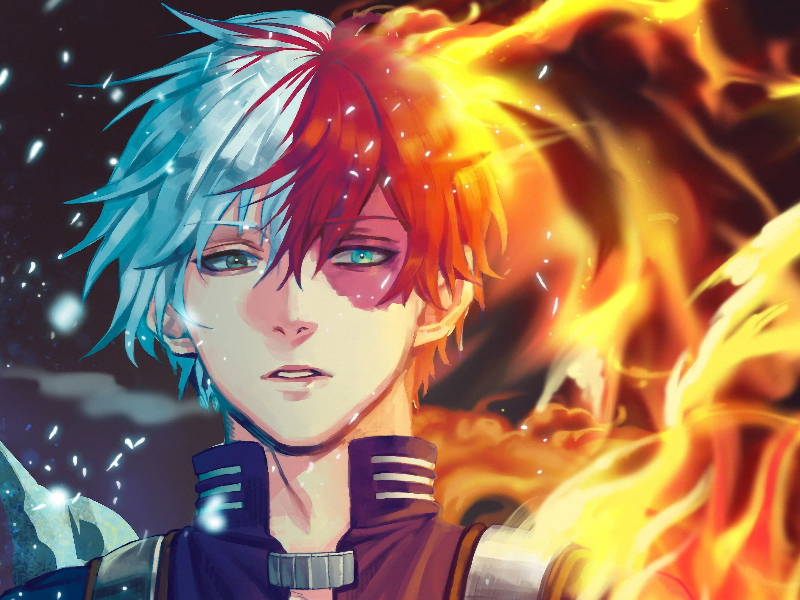

In [7]:
image

In [8]:
image.show()

In [9]:
import matplotlib.pyplot as plt

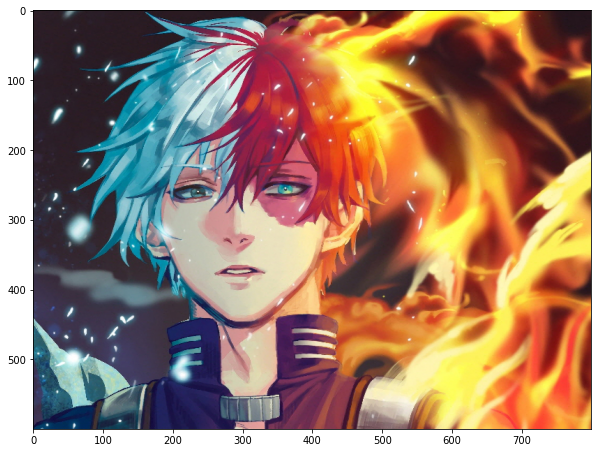

In [10]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

In [11]:
print(image.size)

(800, 600)


In [12]:
print(image.mode)

RGB


In [13]:
im = image.load() 

We can check the image intensity at the xth column and yth row

In [14]:
x = 0
y = 1
im[y,x]

(44, 31, 41)

In [15]:
image.save("todo.jpg")

Grayscale Images, Quantization and Color Channels

In [16]:
from PIL import ImageOps 

Grayscale images have pixel values representing the amount of light or intensity of that pixel. Light shades of gray have a high-intensity while darker shades have a lower intensity, i.e, white has the highest intensity and black the lowest.

In [17]:
img_gray = ImageOps.grayscale(image)

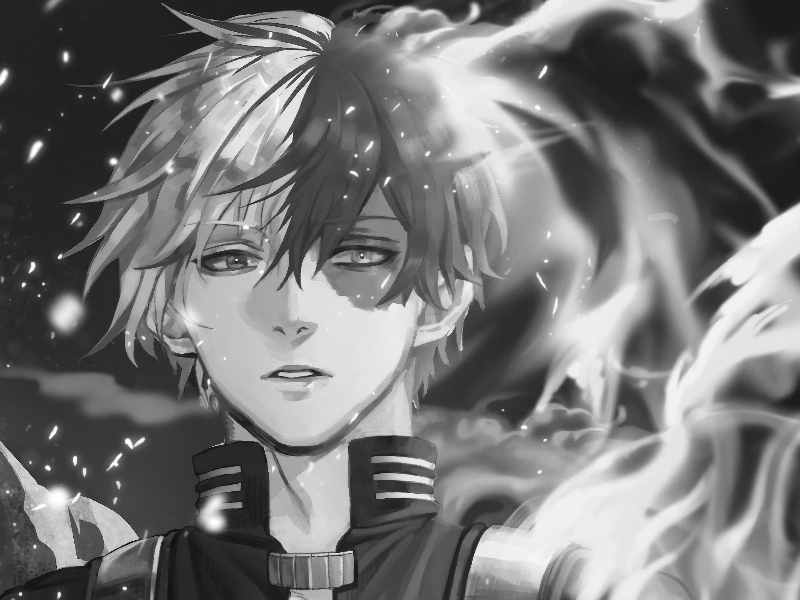

In [18]:
img_gray

In [20]:
#The mode i L for grayscale
img_gray.mode

'L'

<h1>Quantization</h1>
The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method quantize. Let's repeatably cut the number of levels in half and observe what happens:

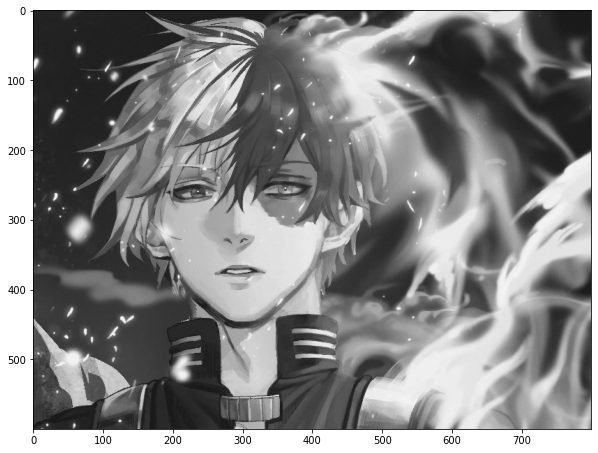

In [23]:
#Half the levels does not make any noticable difference
img = img_gray.quantize(256 // 2)
#image_gray.show()
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.show()

Let’s continue dividing the number of values by two and compare it to the original image.

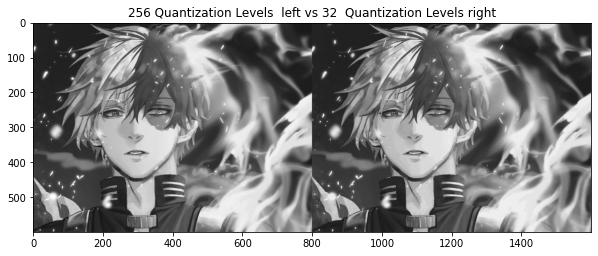

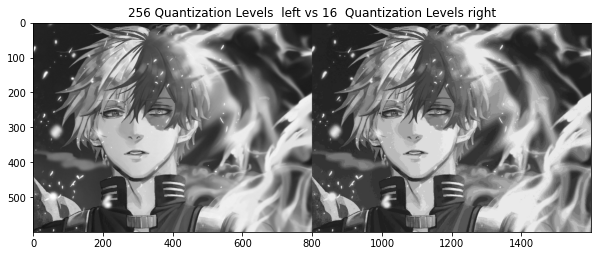

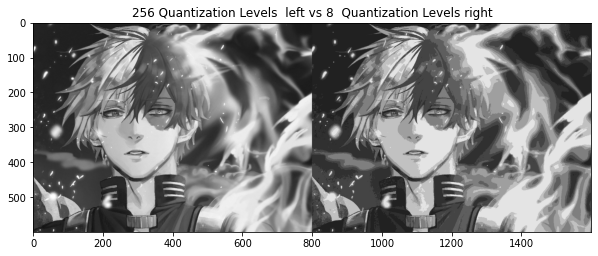

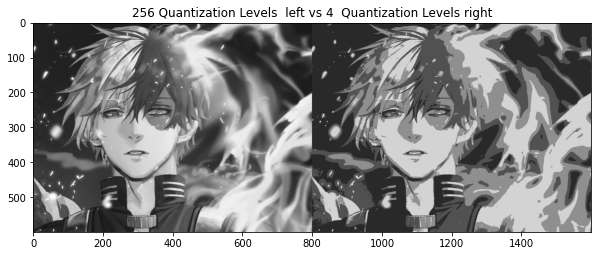

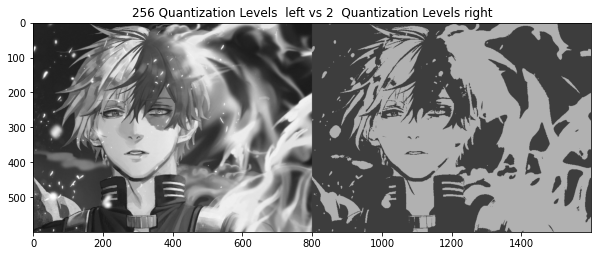

In [26]:
for n in range(3,8):
    plt.figure(figsize=(10,10))

    plt.imshow(get_concat_h(img_gray,  img_gray.quantize(256//2**n))) 
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
    plt.show()

<h1>Color Channels<h1>


We can also work with the different color channels. Consider the following image:

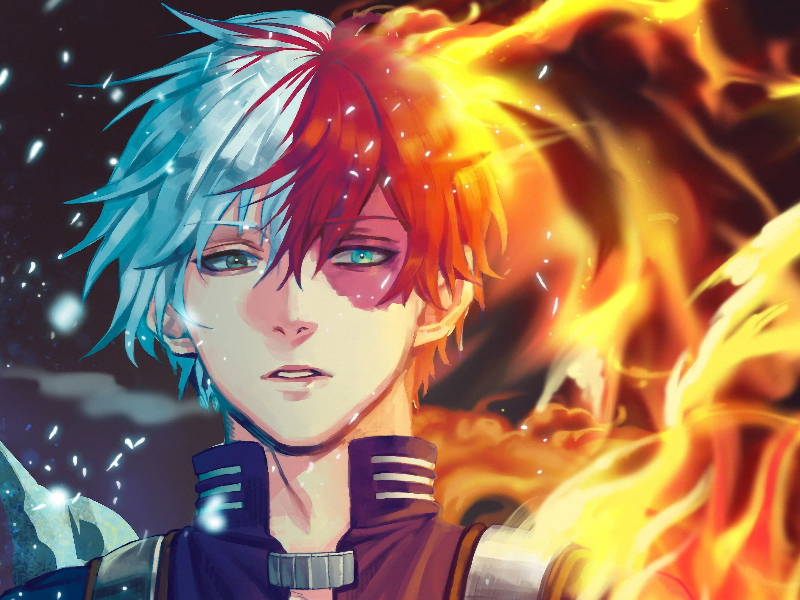

In [27]:
todo = Image.open(my_image)
todo

We can obtain the different RGB color channels and assign them to the variables red, green, and blue:

In [32]:
red, green, blue = todo.split()

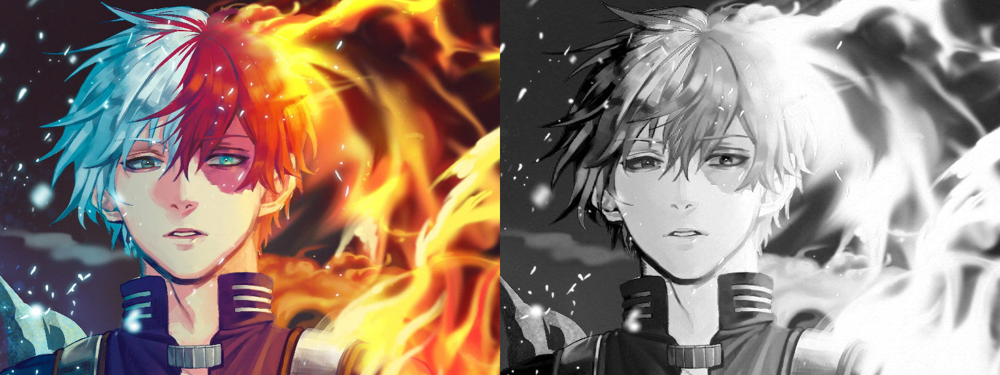

In [29]:
#orginal image with red channel
get_concat_h(todo, red)

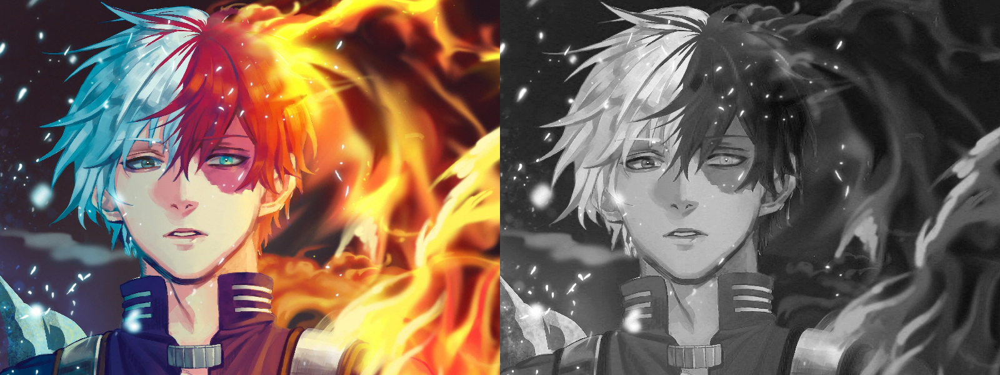

In [30]:
#orginal image with blue channel
get_concat_h(todo, blue)

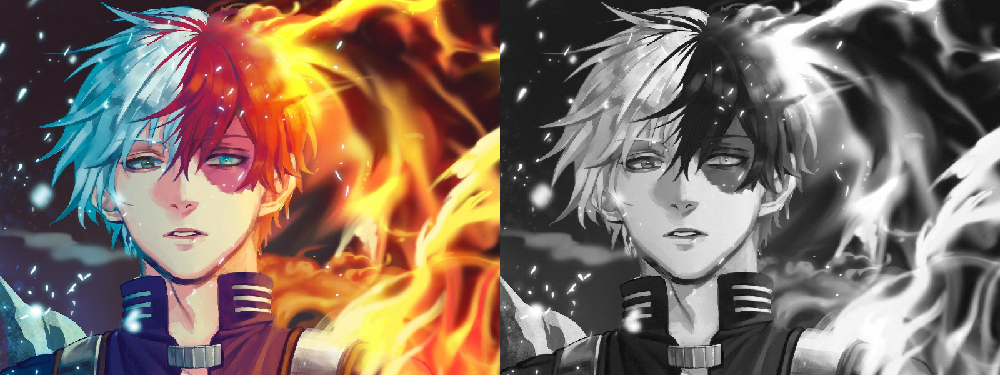

In [33]:
#orginal image with green channel
get_concat_h(todo, green)

<h1>PIL Images into NumPy Arrays</h1>

NumPy is a library for Python, allowing you to work with multi-dimensional arrays and matrices. We can convert a PIL image to a NumPy array. We use asarray() or array function from NumPy to convert PIL images into NumPy arrays.

In [34]:
import numpy as np

In [35]:
array= np.asarray(image)
print(type(array))

<class 'numpy.ndarray'>


In [36]:
array = np.array(image)

The attribute shape of a numpy.array object returns a tuple corresponding to the dimensions of it, the first element gives the number of rows or height of the image, the second is element is the number of columns or width of the image. The final element is the number of colour channels.

In [38]:
print(array.shape)

(600, 800, 3)


In [40]:
#find max intensity value in array 
array.max()

255

In [41]:
#fin min intensity value in array
array.min()

0

<h1>Indexing <h1>

You can plot the array as an image:

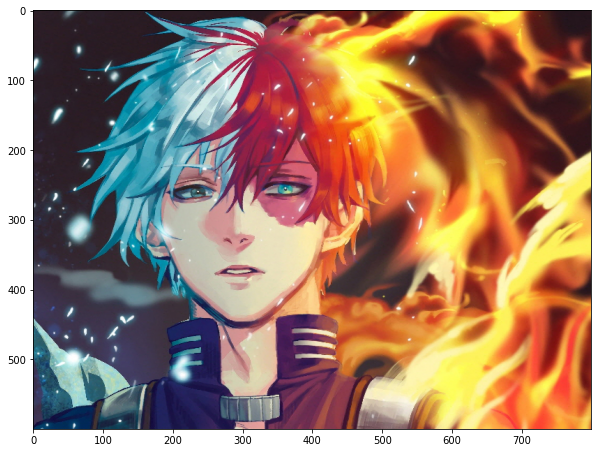

In [42]:
plt.figure(figsize=(10,10))
plt.imshow(array)
plt.show()

We can use numpy slicing, for example, we can return the first 256 rows corresponding to the top half of the image:

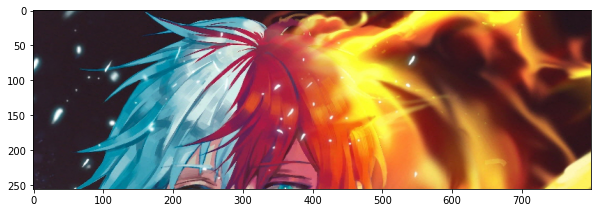

In [43]:
plt.figure(figsize=(10,10))
plt.imshow(array[0:256,:,:])
plt.show()

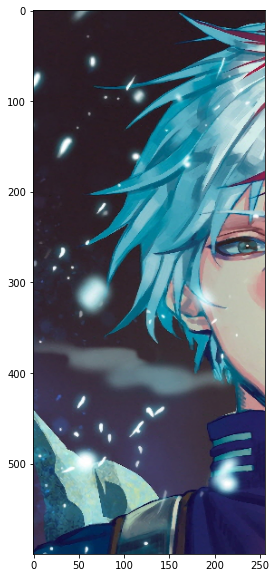

In [44]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,0:256,:])
plt.show()

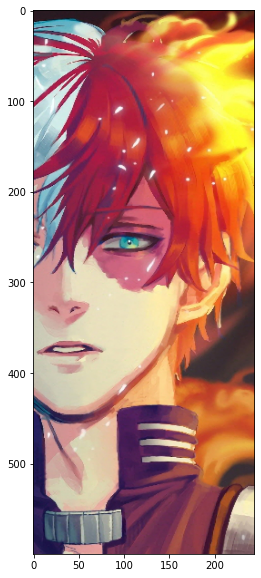

In [45]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,256:500,:])
plt.show()

<h1>Color Channel<h1>

We can create a new array and set all but the red color channels to zero. Therefore, when we display the image it appears red:

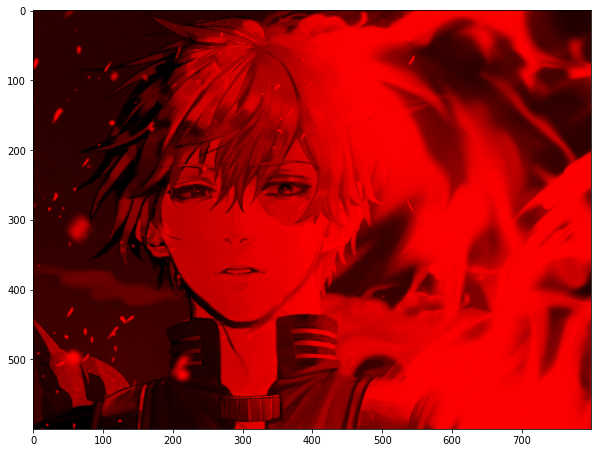

In [46]:
red=array.copy()
red[:,:,1] = 0
red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(red)
plt.show()

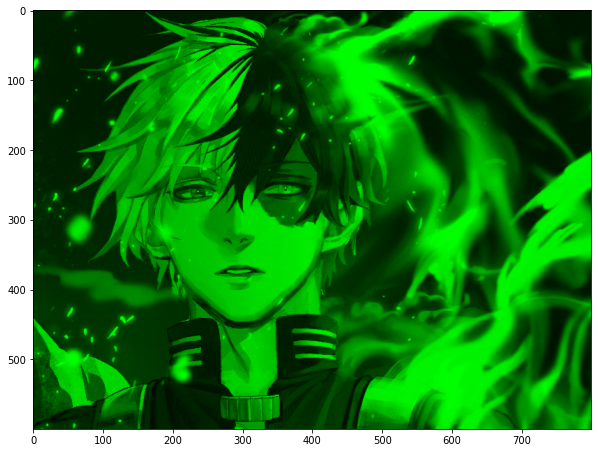

In [48]:
green=array.copy()
green[:,:,0] = 0
green[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(green)
plt.show()

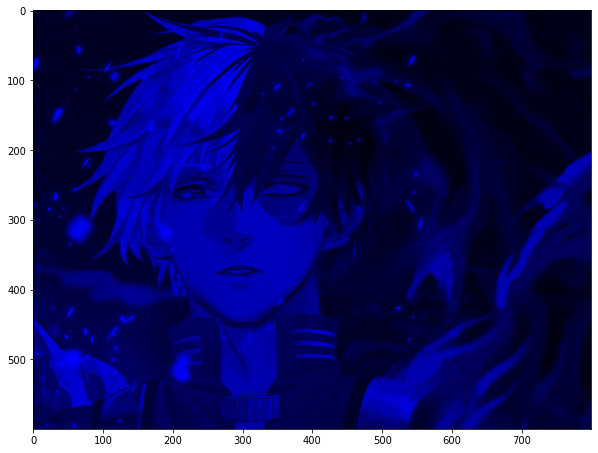

In [49]:
blue=array.copy()
blue[:,:,0] = 0
blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue)
plt.show()

Q: Get blue channel out from the image and then plot

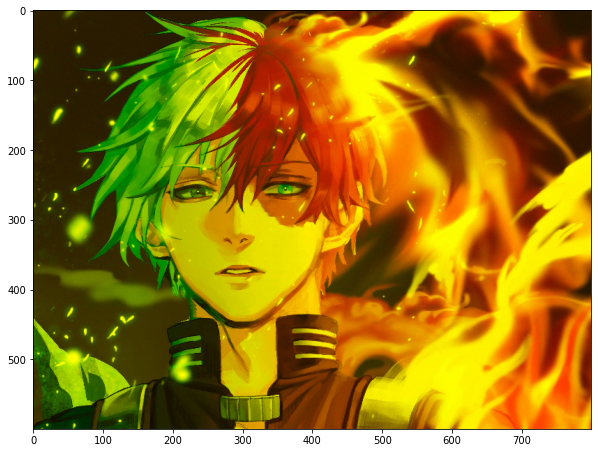

In [50]:
blue_array = array.copy()
blue_array[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue_array)
plt.show()

#OpenCV Library

In [51]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

In [52]:
my_image = "/content/drive/MyDrive/CV images/Kakashi.jpg"

In [53]:
import os
cwd = os.getcwd()
cwd 

'/content'

In [54]:
image_path = os.path.join(cwd, my_image)
image_path

'/content/drive/MyDrive/CV images/Kakashi.jpg'

In [55]:
import cv2

The imread() method loads an image from the specified file, the input is the path of the image to be read (just like PIL), the flag paramter specifies how the image should be read, and the default value is cv2.IMREAD_COLOR

In [56]:
image = cv2.imread(my_image)

The result is a numpy array with intensity values as 8-bit unsigned integers.

In [57]:
type(image)

numpy.ndarray

In [58]:
image.shape

(600, 800, 3)

<h1>Plotting an Image<h1>

In [59]:
import matplotlib.pyplot as plt

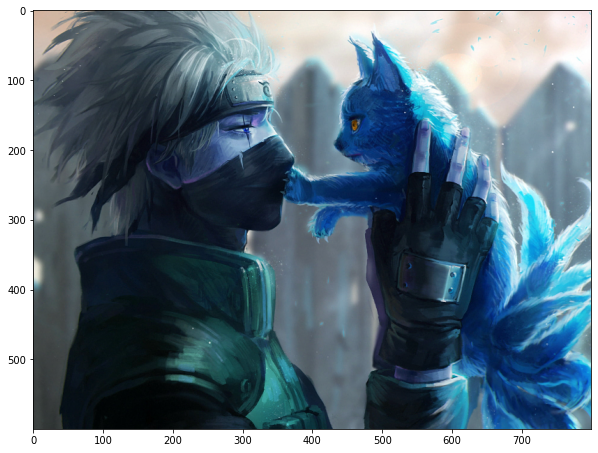

In [60]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

In [61]:
new_image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

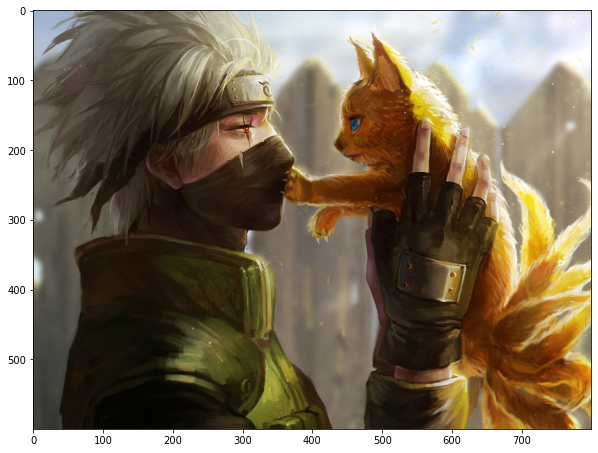

In [62]:
plt.figure(figsize=(10,10))
plt.imshow(new_image)
plt.show()

<h1>Grayscale Images <h1>

Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function cvtColor.

The code for RGB to gray is cv2.COLOR_BGR2GRAY, we apply the function:

In [63]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

Now the image array is left with one dimension

In [64]:
image_gray.shape

(600, 800)

For plotting we have to specify the color map is gray 

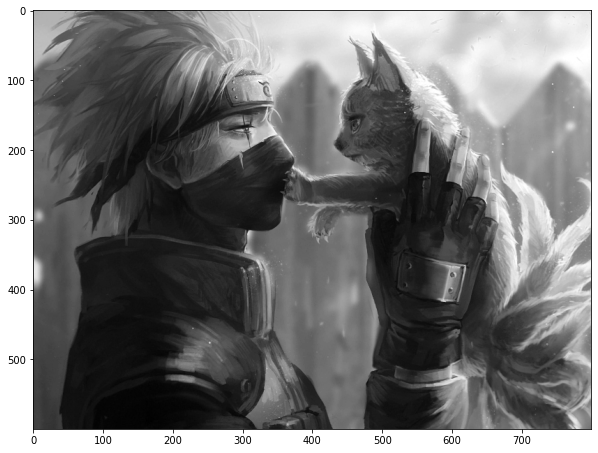

In [65]:
plt.figure(figsize=(10, 10))
plt.imshow(image_gray, cmap='gray')
plt.show()

save image as a grayscale image

In [66]:
cv2.imwrite('Kakashi_gray_cv.jpg', image_gray)

True

<h1>Color Channels<h1>


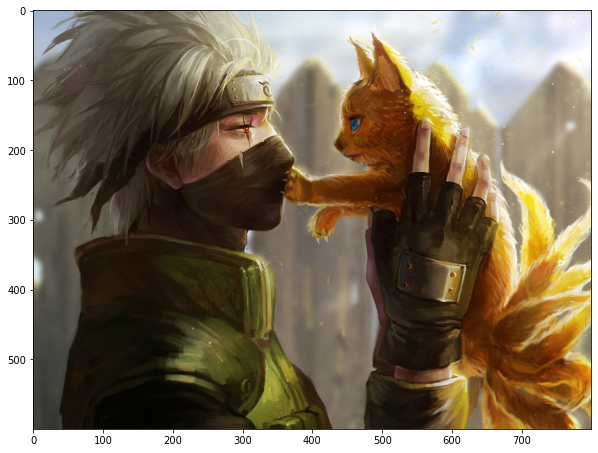

In [67]:
shi=cv2.imread(my_image)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(shi, cv2.COLOR_BGR2RGB))
plt.show()

In [68]:
blue, green, red = shi[:, :, 0], shi[:, :, 1], shi[:, :, 2]

We can concatenate each image channel the images using the function vconcat.

In [69]:
im_bgr = cv2.vconcat([blue, green, red])

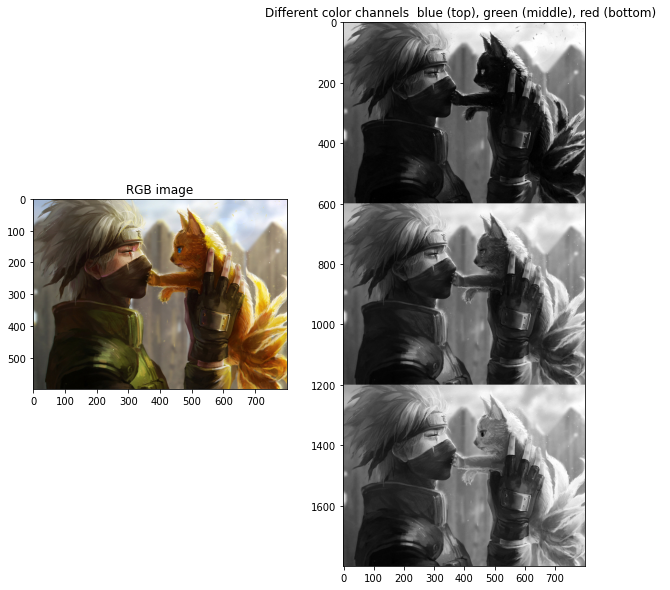

In [70]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(shi, cv2.COLOR_BGR2RGB))
plt.title("RGB image")
plt.subplot(122)
plt.imshow(im_bgr,cmap='gray')
plt.title("Different color channels  blue (top), green (middle), red (bottom)  ")
plt.show()

<h1>Indexing<h1>

We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:

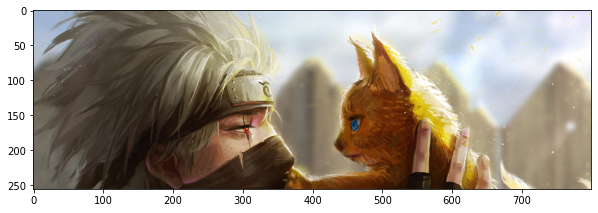

In [71]:
plt.figure(figsize=(10,10))
plt.imshow(new_image[0:256,:,:])
plt.show()

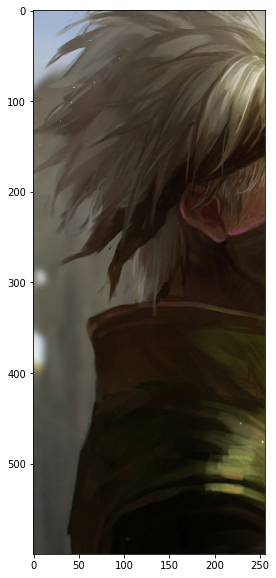

In [72]:
plt.figure(figsize=(10,10))
plt.imshow(new_image[:,0:256,:])
plt.show()

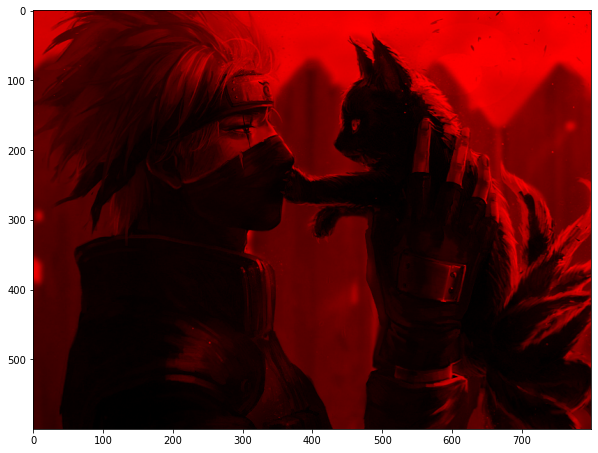

In [73]:
red = new_image.copy()
red[:, :, 0] = 0
red[:, :, 1] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(red, cv2.COLOR_BGR2RGB))
plt.show()

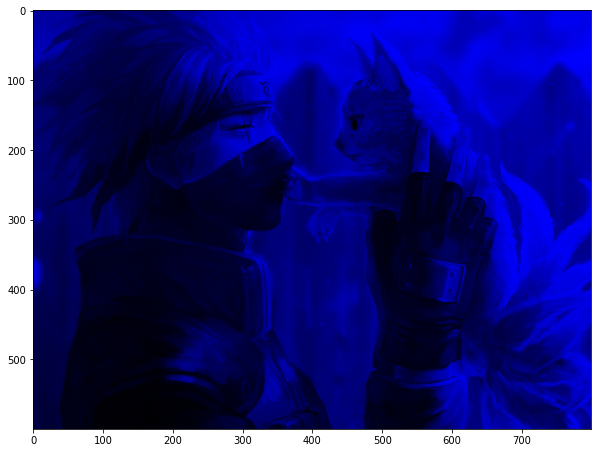

In [74]:
blue = new_image.copy()
blue[:, :, 1] = 0
blue[:, :, 2] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(blue, cv2.COLOR_BGR2RGB))
plt.show()

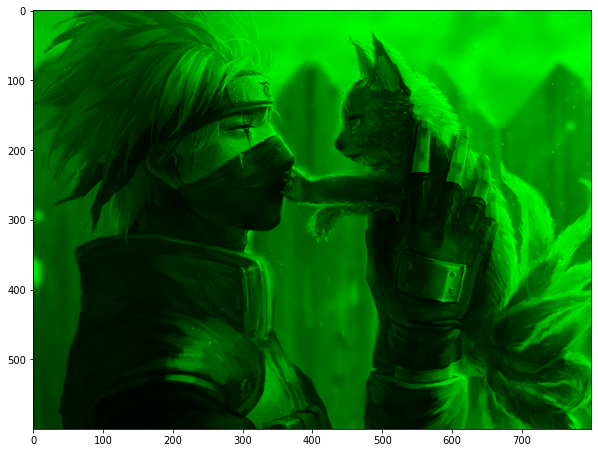

In [75]:
green = new_image.copy()
green[:, :, 0] = 0
green[:, :, 2] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(green, cv2.COLOR_BGR2RGB))
plt.show()

Taking Blue channel out of the image

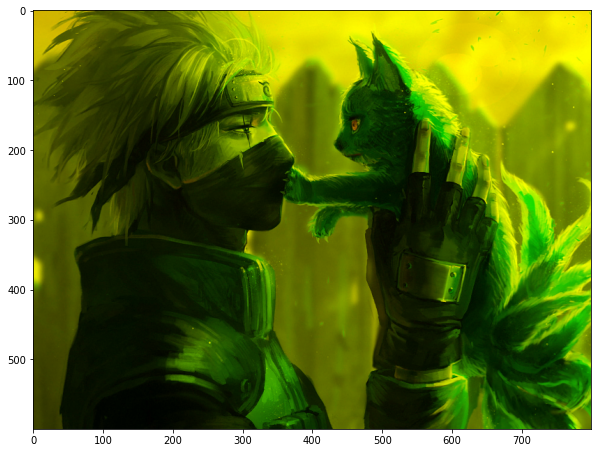

In [76]:
shi = new_image.copy()
shi[:, :, 0] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(shi, cv2.COLOR_BGR2RGB))
plt.show()